Plot a single magnetic microgel (mmgel; a gel containing magnetic nanoparticles particles (MNPs))

In [1]:
import sys

sys.path.append("../")

In [6]:
from pathlib import Path

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


from config import Config

In [7]:
def extract_timestep(p: Path) -> int:
    return int(p.stem.split("_")[-1])

def get_pos_files(gel_dir_path: Path, stripe_size: int=1) -> pd.DataFrame:
    all_pos_files = sorted(
        (gel_dir_path / "raw/mmgel_eq").glob("*.npy"), key=extract_timestep)
    pos_files = all_pos_files[::1]
    timesteps = [extract_timestep(p) for p in pos_files]
    config = Config.from_file(gel_dir_path / "config.json")
    df = pd.DataFrame({"paths": pos_files, "timestep": timesteps})
    df["forcefield"] = config.agent_force_field
    df["ptype"] = pd.Series([("MNP" if "MNPPos" in str(p) else "Bead") for p in df["paths"]], dtype="category")
    tmp_df = df[df["ptype"]=="MNP"]
    chosen_timesteps = sorted(set(tmp_df["timestep"]))[::stripe_size]
    df = df[np.isin(df["timestep"], chosen_timesteps)]
    return df

gel_dir = Path().home() / "data/mmgel/production4/run_2_ff_none_meshw_5.0_charge_0.05"

In [ ]:
pos_df = get_pos_files(gel_dir, stripe_size=20)
pos_df.sort_values(by="timestep")

In [ ]:
pos_df[pos_df["timestep"] == 541500]

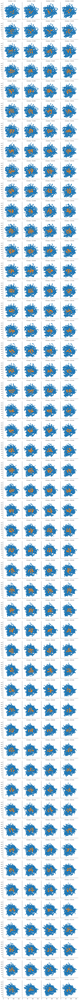

In [6]:
from utils.mymath import random_rotation_matrix

def plot_gels(df):
    g = sns.FacetGrid(
        df, col="timestep", col_wrap=4,
    )
    # g.figure.set_size_inches(12, 6)

    def plot_points(data, color, **kwargs):
        if len(data) < 2:
            display(data)
        bead_df = data[data["ptype"]=="Bead"][::20]
        mnp_df = data[data["ptype"]=="MNP"][::20]
        
        bead_pos = np.load(bead_df["paths"].iloc[0])
        mnp_pos = np.load(mnp_df["paths"].iloc[0])

        bead_com = np.mean(bead_pos, axis=0)
        are_mnps_inside = np.linalg.norm(mnp_pos - bead_com, axis=1) < 30
        inside_mnp_pos = mnp_pos[are_mnps_inside]

        ax = plt.gca()
        ax.scatter(*bead_pos[:, :2].T, s=1.0, alpha=1.0)
        ax.scatter(*inside_mnp_pos[:, :2].T, s=100.0, alpha=0.7)

    g.map_dataframe(plot_points)
    g.add_legend()
    plt.show()


plot_gels(pos_df)

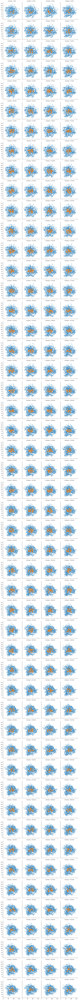

In [7]:
from utils.mymath import random_rotation_matrix

def plot_gels(df):
    g = sns.FacetGrid(
        df, col="timestep", col_wrap=4,
    )
    # g.figure.set_size_inches(12, 6)

    def plot_points(data, color, **kwargs):
        if len(data) < 2:
            display(data)
        bead_df = data[data["ptype"]=="Bead"][::20]
        mnp_df = data[data["ptype"]=="MNP"][::20]
        
        bead_pos = np.load(bead_df["paths"].iloc[0])[::10]
        mnp_pos = np.load(mnp_df["paths"].iloc[0])

        bead_com = np.mean(bead_pos, axis=0)

        # rot_matrix = random_rotation_matrix()
        # bead_pos = (bead_pos - bead_com) @ rot_matrix + bead_com

        are_mnps_inside = np.linalg.norm(mnp_pos - bead_com, axis=1) < 30
        inside_mnp_pos = mnp_pos[are_mnps_inside]

        ax = plt.gca()
        ax.scatter(*bead_pos[:, :2].T, s=1.0, alpha=1.0)
        ax.scatter(*inside_mnp_pos[:, :2].T, s=100.0, alpha=0.7)

    g.map_dataframe(plot_points)
    g.add_legend()
    plt.show()


plot_gels(pos_df)